## 1) Installazione librerie e check GPU

In [ ]:
# Installo le librerie che mi servono
!pip install -qq ultralytics
!pip install -qq fiftyone
!pip install -qq opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 126.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.6/112.6 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.8/74.8 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 144.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 104.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.0/309.0 kB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.3/934.3 kB 74.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 4.5 MB/s eta 0:

## 2) Import delle librerie

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import fiftyone as fo
import fiftyone.zoo as foz
from ultralytics import YOLO

print("Librerie importate!")

/usr/local/lib/python3.12/dist-packages/glob2/fnmatch.py:141: SyntaxWarning: invalid escape sequence '\Z'
  return '(?ms)' + res + '\Z'


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Librerie importate!


## 3) Download dataset con FiftyOne

Scarico le immagini da OpenImages per le 5 classi di animali.

In [ ]:
# Le classi che voglio
classi = ["Horse", "Lizard", "Mouse", "Hamster", "Mule"]

print("Inizio download...")
print("Classi:", classi)

Inizio download...
Classi: ['Horse', 'Lizard', 'Mouse', 'Hamster', 'Mule']


In [ ]:
# Scarico il dataset da OpenImages
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split=None,
    label_types=["detections"],
    classes=classi,
    max_samples=3500, # 1500
    seed=42,
    shuffle=True
) # tempo stimato massimo 5 minuti

print("Dataset scaricato!")
print("Numero totale immagini:", len(dataset))

# Guardo quali campi ha il dataset
print("\nCampi del dataset:")
print(dataset.get_field_schema())

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/open-images-v7/train' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv' to '/root/fiftyone/open-images-v7/train/metadata/image_ids.csv'


 100% |██████|    4.8Gb/4.8Gb [2.2s elapsed, 0s remaining, 2.3Gb/s]        


INFO:eta.core.utils: 100% |██████|    4.8Gb/4.8Gb [2.2s elapsed, 0s remaining, 2.3Gb/s]        


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/train/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmppqjithg6/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/train/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 3500 images


 100% |█████████████████| 3500/3500 [52.4s elapsed, 0s remaining, 67.4 files/s]      


INFO:eta.core.utils: 100% |█████████████████| 3500/3500 [52.4s elapsed, 0s remaining, 67.4 files/s]      


INFO:fiftyone.zoo.datasets:Downloading split 'test' to '/root/fiftyone/open-images-v7/test' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/test/test-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/test/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/test/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmp5_rfgfnw/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/test/labels/detections.csv'


Only found 1438 (<3500) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 1438 images


  99% |████████████████\| 1430/1438 [22.0s elapsed, 123.9ms remaining, 64.6 files/s] 

 100% |█████████████████| 1438/1438 [22.1s elapsed, 0s remaining, 68.3 files/s]      


INFO:eta.core.utils: 100% |█████████████████| 1438/1438 [22.1s elapsed, 0s remaining, 68.3 files/s]      


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/validation/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/validation/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmphq3d_yq5/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/validation/labels/detections.csv'


Only found 453 (<3500) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 453 images


 100% |███████████████████| 453/453 [7.0s elapsed, 0s remaining, 73.9 files/s]       


INFO:eta.core.utils: 100% |███████████████████| 453/453 [7.0s elapsed, 0s remaining, 73.9 files/s]       


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'train'


 100% |███████████████| 3500/3500 [21.8s elapsed, 0s remaining, 158.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 3500/3500 [21.8s elapsed, 0s remaining, 158.6 samples/s]      


Loading 'open-images-v7' split 'test'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'test'


 100% |███████████████| 1438/1438 [11.8s elapsed, 0s remaining, 128.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1438/1438 [11.8s elapsed, 0s remaining, 128.0 samples/s]      


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |█████████████████| 453/453 [4.0s elapsed, 0s remaining, 123.7 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 453/453 [4.0s elapsed, 0s remaining, 123.7 samples/s]      


Dataset 'open-images-v7-3500' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-3500' created


Dataset scaricato!
Numero totale immagini: 5391

Campi del dataset:
OrderedDict({'id': <fiftyone.core.fields.ObjectIdField object at 0x7c37e9698560>, 'filepath': <fiftyone.core.fields.StringField object at 0x7c37f9672a80>, 'tags': <fiftyone.core.fields.ListField object at 0x7c37e969a6f0>, 'metadata': <fiftyone.core.fields.EmbeddedDocumentField object at 0x7c37e88a0f20>, 'created_at': <fiftyone.core.fields.DateTimeField object at 0x7c37e87d98b0>, 'last_modified_at': <fiftyone.core.fields.DateTimeField object at 0x7c37e87d9a00>, 'ground_truth': <fiftyone.core.fields.EmbeddedDocumentField object at 0x7c37e92f6510>})


In [ ]:
print(dataset.count_values("ground_truth.detections.label"))

{'Jacket': 14, 'Mixing bowl': 1, 'Vehicle': 201, 'Dress': 18, 'Rabbit': 42, 'Flag': 32, 'Box': 1, 'Boot': 5, 'Bicycle helmet': 8, 'Bronze sculpture': 48, 'Bicycle': 9, 'Shorts': 10, 'Girl': 161, 'Horse': 6178, 'Human arm': 304, 'Home appliance': 5, 'Flowerpot': 20, 'Shelf': 5, 'Sports uniform': 2, 'Picture frame': 10, 'Swimwear': 1, 'Football helmet': 2, 'Insect': 2, 'Human leg': 261, 'Antelope': 1, 'Kangaroo': 1, 'Sea turtle': 2, 'Tire': 91, 'Nightstand': 1, 'Plant': 1313, 'Clock': 2, 'Sheep': 11, 'Christmas tree': 2, 'Cart': 451, 'Building': 83, 'Tower': 5, 'Person': 6368, 'Car': 177, 'Guitar': 1, 'Jeans': 83, 'Tie': 1, 'Human hand': 115, 'Carrot': 5, 'Woman': 477, 'Light bulb': 1, 'Computer mouse': 1, 'Weapon': 101, 'Watch': 1, 'Goat': 2, 'Carnivore': 53, 'Fountain': 6, 'Invertebrate': 7, 'Tree': 2456, 'Clothing': 3625, 'Helmet': 218, 'Furniture': 12, 'Unicycle': 1, 'Food': 5, 'Otter': 9, 'Porch': 2, 'Table': 7, 'Human body': 428, 'Teddy bear': 5, 'Doll': 2, 'Door': 2, 'Mirror': 1, 

In [ ]:
# Filtro per tenere solo le immagini con le mie classi
# OpenImages usa il campo "ground_truth" invece di "detections"
dataset_filtrato = dataset.filter_labels("ground_truth", fo.ViewField("label").is_in(classi)) # Rimuove le annotazioni che non sono dentro le nostre classi
dataset_filtrato = dataset_filtrato.match(fo.ViewExpression.length(fo.ViewField("ground_truth.detections")) > 0) # Elimina tutte le immagini senza nessuna delle tue classi.

print("Immagini dopo il filtro:", len(dataset_filtrato))

Immagini dopo il filtro: 5391


In [ ]:
# Conto quante immagini ho per ogni classe
print("\nImmagini per classe:")
for classe in classi:
    num = len(dataset_filtrato.filter_labels("ground_truth", fo.ViewField("label") == classe))
    print(f"{classe}: {num}")


Immagini per classe:
Horse: 3539
Lizard: 1049
Mouse: 514
Hamster: 358
Mule: 402


In [ ]:
# Divido il dataset in train/val/test
# 70% train, 15% val, 15% test

tot = len(dataset_filtrato)
n_train = int(tot * 0.7)
n_val = int(tot * 0.15)
n_test = tot - n_train - n_val

print(f"\nTrain: {n_train}")
print(f"Val: {n_val}")
print(f"Test: {n_test}")


Train: 3773
Val: 808
Test: 810


In [ ]:
# Prendo gli ID delle immagini e li mescolo
tutti_id = dataset_filtrato.values("id")
random.seed(42)
random.shuffle(tutti_id)

# Divido gli ID
train_ids = tutti_id[:n_train]
val_ids = tutti_id[n_train:n_train+n_val]
test_ids = tutti_id[n_train+n_val:]

print("ID divisi!")

ID divisi!


In [ ]:
# Aggiungo i tag train/val/test
dataset_filtrato.untag_samples("train")
dataset_filtrato.untag_samples("val")
dataset_filtrato.untag_samples("test")

dataset_filtrato.select(train_ids).tag_samples("train")
dataset_filtrato.select(val_ids).tag_samples("val")
dataset_filtrato.select(test_ids).tag_samples("test")

print("Tag aggiunti!")
print("\nTag assegnati:")
print("Train:", len(dataset_filtrato.match_tags("train")))
print("Val:", len(dataset_filtrato.match_tags("val")))
print("Test:", len(dataset_filtrato.match_tags("test")))

Tag aggiunti!

Tag assegnati:
Train: 3773
Val: 808
Test: 810


In [ ]:
# Conto quante immagini del TEST set hanno ogni classe
test_view = dataset_filtrato.match_tags("test")

print("IMMAGINI PER CLASSE NEL TEST SET:")
for classe in classi:
    n = len(test_view.filter_labels("ground_truth", fo.ViewField("label") == classe))
    print(f"- {classe}: {n} immagini")

IMMAGINI PER CLASSE NEL TEST SET:
- Horse: 533 immagini
- Lizard: 160 immagini
- Mouse: 86 immagini
- Hamster: 57 immagini
- Mule: 44 immagini


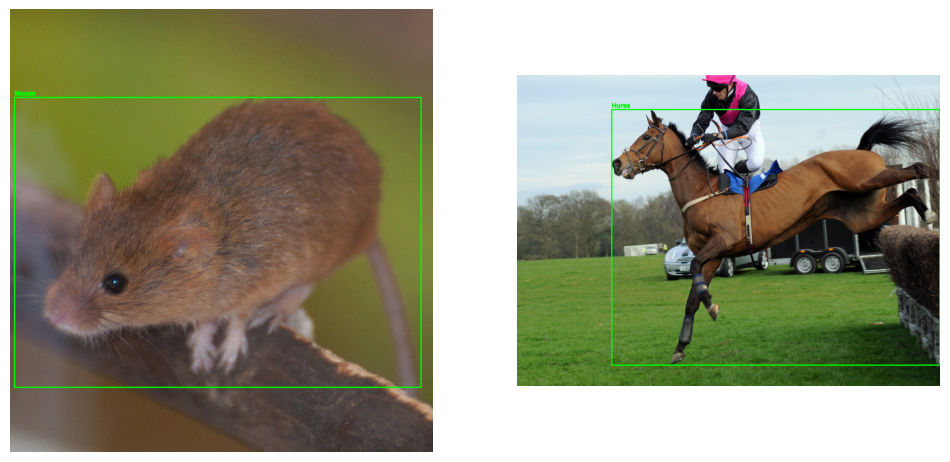

In [ ]:
# Mostro 2 immagini di esempio
train_samples = dataset_filtrato.match_tags("train")
sample_list = list(train_samples.take(2))

# Prima immagine
img1 = cv2.imread(sample_list[0].filepath)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
h1, w1 = img1.shape[:2]

# Disegno i bbox sulla prima immagine
for det in sample_list[0].ground_truth.detections:
    bbox = det.bounding_box
    x = int(bbox[0] * w1)
    y = int(bbox[1] * h1)
    w_box = int(bbox[2] * w1)
    h_box = int(bbox[3] * h1)
    cv2.rectangle(img1, (x, y), (x+w_box, y+h_box), (0, 255, 0), 2)
    cv2.putText(img1, det.label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Seconda immagine
img2 = cv2.imread(sample_list[1].filepath)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
h2, w2 = img2.shape[:2]

# Disegno i bbox sulla seconda immagine
for det in sample_list[1].ground_truth.detections:
    bbox = det.bounding_box
    x = int(bbox[0] * w2)
    y = int(bbox[1] * h2)
    w_box = int(bbox[2] * w2)
    h_box = int(bbox[3] * h2)
    cv2.rectangle(img2, (x, y), (x+w_box, y+h_box), (0, 255, 0), 2)
    cv2.putText(img2, det.label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Mostro le due immagini
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(img1)
ax[0].axis('off')
ax[1].imshow(img2)
ax[1].axis('off')
plt.show()

## 4) Esportazione in formato YOLO

In [ ]:
# Esporto in formato YOLO
export_path = "/content/dataset_yolo"

print("Esporto train...")
train_view = dataset_filtrato.match_tags("train")
train_view.export(
    export_dir=export_path + "/train",
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    classes=classi
)

print("Esporto val...")
val_view = dataset_filtrato.match_tags("val")
val_view.export(
    export_dir=export_path + "/val",
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    classes=classi
)

print("Esporto test...")
test_view = dataset_filtrato.match_tags("test")
test_view.export(
    export_dir=export_path + "/test",
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    classes=classi
)

print("Tutto esportato!")

Esporto train...
 100% |███████████████| 3773/3773 [5.5s elapsed, 0s remaining, 734.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 3773/3773 [5.5s elapsed, 0s remaining, 734.0 samples/s]      


Esporto val...
 100% |█████████████████| 808/808 [1.2s elapsed, 0s remaining, 717.1 samples/s]         


INFO:eta.core.utils: 100% |█████████████████| 808/808 [1.2s elapsed, 0s remaining, 717.1 samples/s]         


Esporto test...
 100% |█████████████████| 810/810 [1.1s elapsed, 0s remaining, 739.3 samples/s]         


INFO:eta.core.utils: 100% |█████████████████| 810/810 [1.1s elapsed, 0s remaining, 739.3 samples/s]         


Tutto esportato!


In [ ]:
# Guardo la struttura delle cartelle
!ls -lh /content/dataset_yolo/train/
!ls -lh /content/dataset_yolo/val/
!ls -lh /content/dataset_yolo/test/

total 12K
-rw-r--r-- 1 root root  117 Dec  2 09:30 dataset.yaml
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 images
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 labels
total 12K
-rw-r--r-- 1 root root  115 Dec  2 09:30 dataset.yaml
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 images
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 labels
total 12K
-rw-r--r-- 1 root root  116 Dec  2 09:30 dataset.yaml
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 images
drwxr-xr-x 3 root root 4.0K Dec  2 09:30 labels


In [ ]:
# Creo il file data.yaml per YOLO
yaml_content = f"""path: {export_path}
train: train/images
val: val/images
test: test/images

nc: {len(classi)}
names: {classi}
"""

yaml_file = export_path + "/data.yaml"
with open(yaml_file, 'w') as f:
    f.write(yaml_content)

print("File data.yaml creato!")
print(yaml_content)

File data.yaml creato!
path: /content/dataset_yolo
train: train/images
val: val/images
test: test/images

nc: 5
names: ['Horse', 'Lizard', 'Mouse', 'Hamster', 'Mule']



## 5) Caricamento modello YOLO

Uso yolov8n perche e piccolo e veloce.

In [ ]:
# Carico il modello pretrainato
model = YOLO("yolo11s.pt")

print("Modello caricato!")

Modello caricato!


## 6) Training

Faccio il training per 15 epoche.

In [ ]:
# Parametri
epoche = 50 # 50
img_size = 640
batch = 16

print(f"Inizio training con {epoche} epoche...")

Inizio training con 50 epoche...


In [ ]:
# Faccio il training
risultati = model.train(
    data=yaml_file,
    epochs=epoche,
    imgsz=img_size,
    batch=batch,
    project="/content/yolo_train",
    name="animali",
    seed=42
)

print("Training finito!") # impiega 20min

Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_yolo/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=animali, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, 

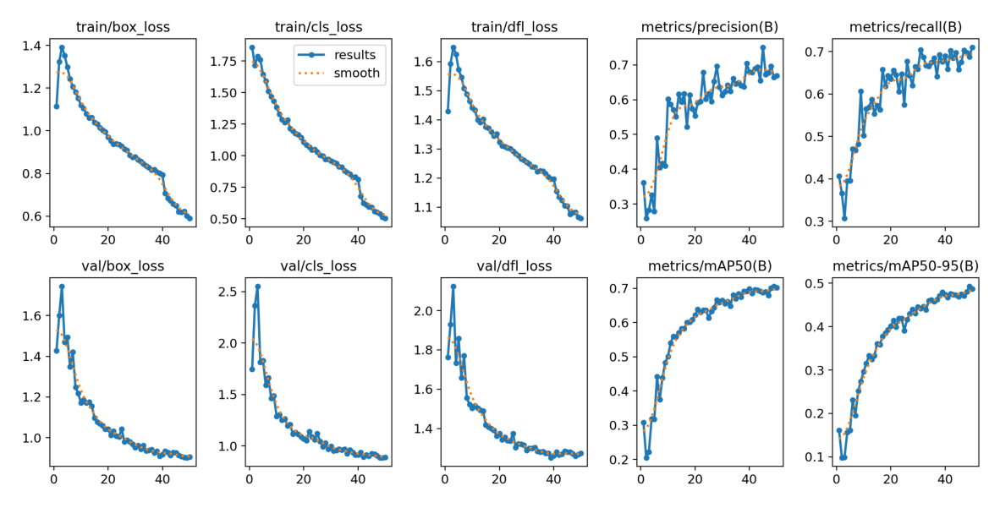

In [ ]:
# Guardo i grafici del training
img_risultati = "/content/yolo_train/animali/results.png"


img = plt.imread(img_risultati)
plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

In [ ]:
# Carico il modello migliore
best_model = YOLO("/content/yolo_train/animali/weights/best.pt")
print("Modello migliore caricato!")

Modello migliore caricato!


## 7) Valutazione sul test set

In [ ]:
# Valuto sul test
print("Valuto sul test set...")
metriche = best_model.val(data=yaml_file, split="test")

print("\nRISULTATI TEST SET")
print("="*40)
print(f"mAP@0.5: {metriche.box.map50}")
print(f"mAP@0.5:0.95: {metriche.box.map}")
print(f"Precision: {metriche.box.mp}")
print(f"Recall: {metriche.box.mr}")

Valuto sul test set...
Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2137.5±1102.3 MB/s, size: 246.8 KB)
val: Scanning /content/dataset_yolo/test/labels/val... 810 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 810/810 1.5Kit/s 0.5s
val: New cache created: /content/dataset_yolo/test/labels/val.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 9.3it/s 5.5s
                   all        810       1336      0.682      0.703      0.705      0.489
                 Horse        533        899      0.782      0.776      0.823      0.657
                Lizard        160        182      0.867      0.861      0.901      0.577
                 Mouse         86         95      0.719      0.836      0.836      0.555
               Hamster     

## 8) Inferenza sul test set

Provo il modello su alcune immagini del test.

In [ ]:
!ls -R /content/dataset_yolo

/content/dataset_yolo:
data.yaml  test  train	val

/content/dataset_yolo/test:
dataset.yaml  images  labels

/content/dataset_yolo/test/images:
val

/content/dataset_yolo/test/images/val:
0005f3ae54e9f9db.jpg  4c5dc1193946e4be.jpg  a348ba5472331b98.jpg
001d80d55c340c9f.jpg  4c909cb97a9d01ba.jpg  a3949101e1b90b7d.jpg
00340f77969ab17d.jpg  4c95bc9043e54753.jpg  a430792c2b76d181.jpg
00413748418e741a.jpg  4cd524001e61a98c.jpg  a514783367405598.jpg
004445e7e2c90b1a.jpg  4cfdc0d8360e78a2.jpg  a521861403e03a6c.jpg
0048fc709542064b.jpg  4d1ea0257d5a1622.jpg  a53c7372d9f628c1.jpg
004db3905ad60f7d.jpg  4d3cd0f5ce5aab88.jpg  a57ac8bf3503664d.jpg
005243f10604e7ab.jpg  4d48f7e100e6dba9.jpg  a5ce6100c5a08ce7.jpg
005cebe3da8ed914.jpg  4d4ca693c19a372f.jpg  a5f894a913473286.jpg
006839b80a3d4ab6.jpg  4e52c6b8ab427dea.jpg  a66b0731cef5ba7b.jpg
0085bc9be84b0823.jpg  4e74a90e910c3350.jpg  a69cf7f979b58d4e.jpg
00a66ce1052f012b.jpg  4e7a4e69c7834afa.jpg  a6a16a7ec88d5afa.jpg
00aab239e1a61d5c.jpg  4ebce23ddb

In [ ]:
# Prendo le immagini del test e seleziono 1 per ogni classe
test_img_folder = "/content/dataset_yolo/test/images/val"

print(f"Cerco immagini in: {test_img_folder}\n")

# Prendo tutti i file
tutti_file = os.listdir(test_img_folder)
test_imgs = []
for f in tutti_file:
    if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png'):
        test_imgs.append(f)

print(f"Trovate {len(test_imgs)} immagini totali")

# Per ogni classe, cerco un'immagine nel test set
# Devo guardare le label per trovare le immagini giuste
test_view = dataset_filtrato.match_tags("test")

img_da_testare = []
classi_trovate = []

print(f"\nCerco 1 immagine per ogni classe:")
for classe in classi:
    # Filtro per questa classe
    samples_classe = test_view.filter_labels("ground_truth", fo.ViewField("label") == classe)

    if len(samples_classe) > 0:
        # Prendo la prima immagine
        sample = samples_classe.first()
        img_name = os.path.basename(sample.filepath)
        img_da_testare.append(img_name)
        classi_trovate.append(classe)
        print(f"  {classe}: {img_name}")
    else:
        print(f"  {classe}: NON TROVATA nel test set")

print(f"\nTrovate {len(img_da_testare)} immagini")

# Faccio inferenza
print(f"\nFaccio inferenza...")
predizioni = []
for img_name in img_da_testare:
    img_path = os.path.join(test_img_folder, img_name)
    risultato = best_model(img_path)
    predizioni.append(risultato[0])

print(f"Inferenza completata!")

Cerco immagini in: /content/dataset_yolo/test/images/val

Trovate 810 immagini totali

Cerco 1 immagine per ogni classe:
  Horse: 2e837d7edea1bd9d.jpg
  Lizard: 0005f3ae54e9f9db.jpg
  Mouse: 422fecd1798ec3db.jpg
  Hamster: eecbdeb1baef44b0.jpg
  Mule: b9a77833f4dfcdc6.jpg

Trovate 5 immagini

Faccio inferenza...

image 1/1 /content/dataset_yolo/test/images/val/2e837d7edea1bd9d.jpg: 480x640 2 Horses, 86.8ms
Speed: 2.6ms preprocess, 86.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset_yolo/test/images/val/0005f3ae54e9f9db.jpg: 480x640 1 Lizard, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/dataset_yolo/test/images/val/422fecd1798ec3db.jpg: 448x640 1 Mouse, 1 Hamster, 89.2ms
Speed: 2.0ms preprocess, 89.2ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/dataset_yolo/test/images/val/eecbdeb1baef44b0.jpg: 480x640 1 Mouse, 1 Hamster, 

In [ ]:
# Prendo le immagini del test
# L'esportazione crea images/val/ invece di solo images/
test_img_folder = "/content/dataset_yolo/test/images/val"

print(f"Cerco le immagini in: {test_img_folder}")

if not os.path.exists(test_img_folder):
    print("ERRORE: Cartella non trovata!")
else:
    tutti_file = os.listdir(test_img_folder)
    print(f"File trovati: {len(tutti_file)}")

    # Filtro solo i file immagine
    test_imgs = []
    for f in tutti_file:
        if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png'):
            test_imgs.append(f)

    print(f"Immagini nel test: {len(test_imgs)}")

Cerco le immagini in: /content/dataset_yolo/test/images/val
File trovati: 810
Immagini nel test: 810



Mostro 5 immagini (1 per classe):

Immagine 1: 2e837d7edea1bd9d.jpg
  Ground Truth: Horse
  Dimensioni immagine: 1024x768
  Numero predizioni totali: 2
 BOX SCELTA (migliore): Horse conf=0.93 coords=(355,288,527,470)


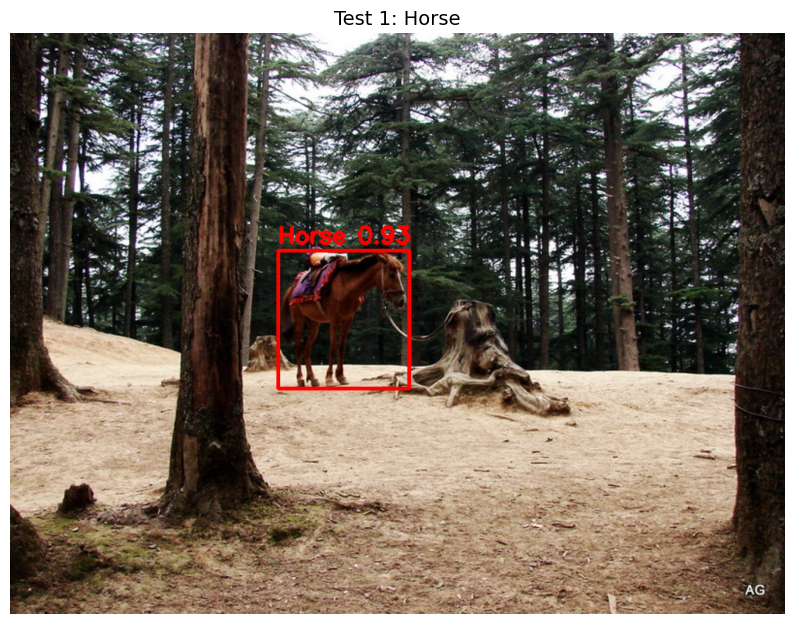


Immagine 2: 0005f3ae54e9f9db.jpg
  Ground Truth: Lizard
  Dimensioni immagine: 1024x768
  Numero predizioni totali: 1
 BOX SCELTA (migliore): Lizard conf=0.82 coords=(640,233,1023,700)


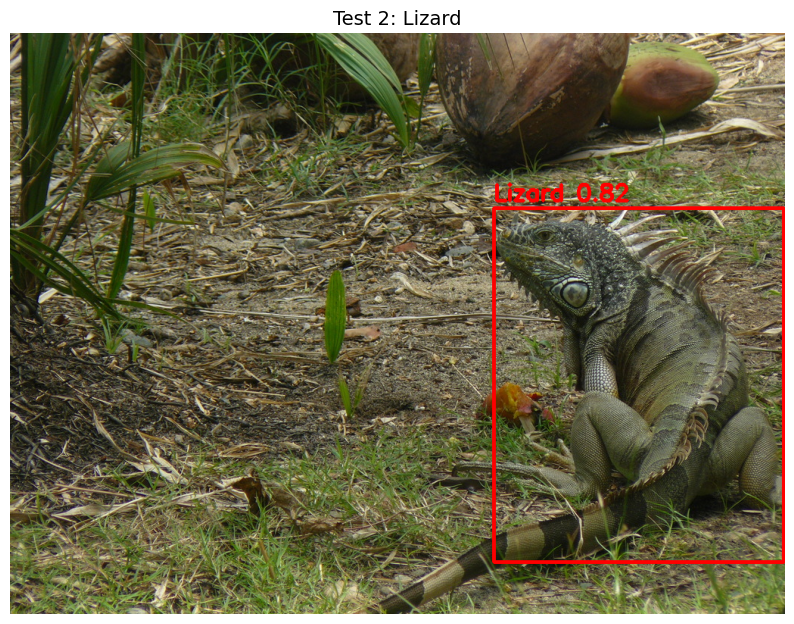


Immagine 3: 422fecd1798ec3db.jpg
  Ground Truth: Mouse
  Dimensioni immagine: 1024x683
  Numero predizioni totali: 2
 BOX SCELTA (migliore): Mouse conf=0.58 coords=(157,199,813,678)


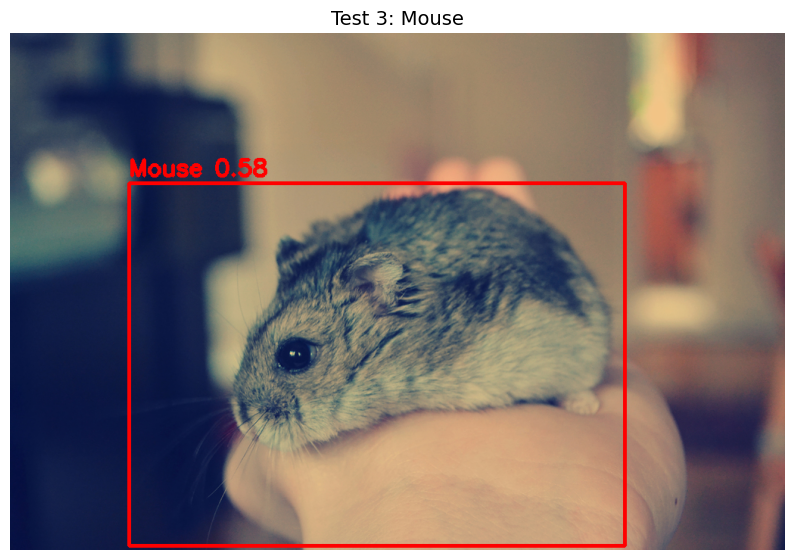


Immagine 4: eecbdeb1baef44b0.jpg
  Ground Truth: Hamster
  Dimensioni immagine: 1024x768
  Numero predizioni totali: 2
 BOX SCELTA (migliore): Mouse conf=0.71 coords=(395,122,815,584)


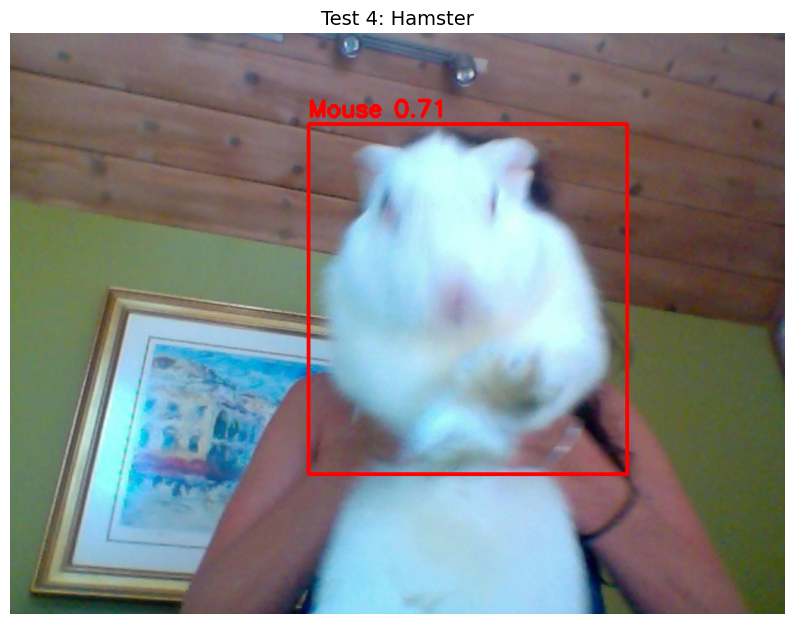


Immagine 5: b9a77833f4dfcdc6.jpg
  Ground Truth: Mule
  Dimensioni immagine: 1024x683
  Numero predizioni totali: 4
 BOX SCELTA (migliore): Horse conf=0.67 coords=(306,226,1024,682)


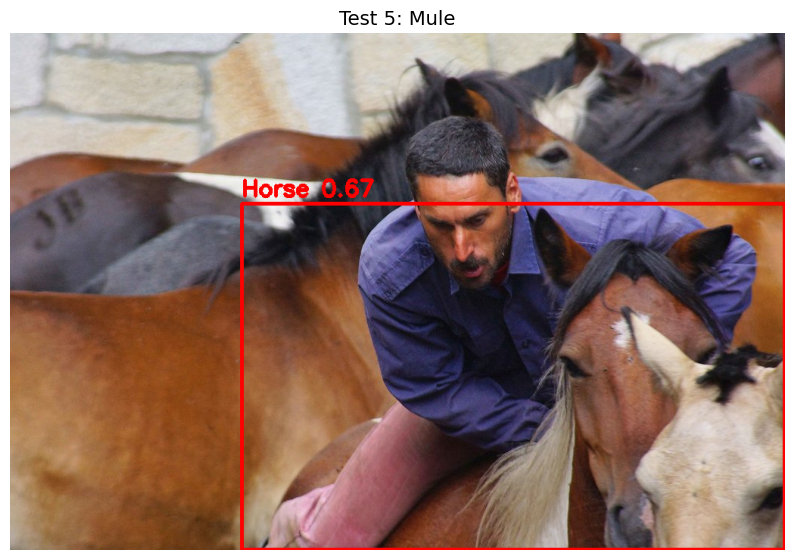

In [ ]:
# Mostro le immagini con le predizioni
print(f"\nMostro {len(img_da_testare)} immagini (1 per classe):\n")

for i in range(len(img_da_testare)):
    img_path = os.path.join(test_img_folder, img_da_testare[i])
    classe_gt = classi_trovate[i]

    print(f"Immagine {i+1}: {img_da_testare[i]}")
    print(f"  Ground Truth: {classe_gt}")

    # DEBUG: verifico se il file esiste
    if not os.path.exists(img_path):
        print(f"  ERRORE: file non trovato: {img_path}\n")
        continue

    img = cv2.imread(img_path)
    if img is None:
        print("  ERRORE caricamento\n")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    print(f"  Dimensioni immagine: {w}x{h}")

    pred = predizioni[i]
    boxes = pred.boxes

    # DEBUG
    print(f"  Numero predizioni totali: {len(boxes)}")
    if len(boxes) == 0:
        print("  ATTENZIONE: Nessun oggetto rilevato!")
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Test {i+1}: {classe_gt} (NO DETECTIONS)", fontsize=14)
        plt.show()
        continue

    # -----------------------------------------
    # 🔥 SELEZIONE DELLA BOX CON CONFIDENZA PIÙ ALTA
    # -----------------------------------------
    best_box = max(boxes, key=lambda b: b.conf[0])

    x1, y1, x2, y2 = best_box.xyxy[0].cpu().numpy()
    conf = best_box.conf[0].cpu().numpy()
    cls = int(best_box.cls[0].cpu().numpy())
    label = classi[cls]

    print(f" BOX SCELTA (migliore): {label} conf={conf:.2f} coords=({x1:.0f},{y1:.0f},{x2:.0f},{y2:.0f})")

    # Disegno SOLO la box migliore
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 4)
    cv2.putText(img, f"{label} {conf:.2f}", (x1, y1-10),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 0, 0), 3)

    # Mostro immagine
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Test {i+1}: {classe_gt}", fontsize=14)
    plt.show()

    print()

In [ ]:
# Stampo i dettagli delle predizioni
print("Dettagli predizioni:\n")

for i in range(len(img_da_testare)):
    print(f"Immagine {i+1}: {img_da_testare[i]}")

    pred = predizioni[i]
    boxes = pred.boxes

    if len(boxes) == 0:
        print("  Nessun oggetto trovato\n")
    else:
        for j, box in enumerate(boxes):
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            label = classi[cls]
            print(f"  Oggetto {j+1}: {label} (confidence: {conf:.3f})")
        print()

Dettagli predizioni:

Immagine 1: 2e837d7edea1bd9d.jpg
  Oggetto 1: Horse (confidence: 0.935)
  Oggetto 2: Horse (confidence: 0.484)

Immagine 2: 0005f3ae54e9f9db.jpg
  Oggetto 1: Lizard (confidence: 0.816)

Immagine 3: 422fecd1798ec3db.jpg
  Oggetto 1: Mouse (confidence: 0.577)
  Oggetto 2: Hamster (confidence: 0.337)

Immagine 4: eecbdeb1baef44b0.jpg
  Oggetto 1: Mouse (confidence: 0.711)
  Oggetto 2: Hamster (confidence: 0.580)

Immagine 5: b9a77833f4dfcdc6.jpg
  Oggetto 1: Horse (confidence: 0.672)
  Oggetto 2: Horse (confidence: 0.545)
  Oggetto 3: Horse (confidence: 0.309)
  Oggetto 4: Mule (confidence: 0.266)



## 9) BONUS - Modello HuggingFace

Provo un modello di object detection da HuggingFace e lo confronto con YOLO.

In [ ]:
# Installo transformers
!pip install transformers

In [ ]:
from transformers import DetrImageProcessor, DetrForObjectDetection
from PIL import Image
import torch

print("Librerie importate!")

Librerie importate!


In [ ]:
# Carico DETR
print("Carico DETR...")
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
detr = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

# Metto su GPU se c'e
device = "cuda" if torch.cuda.is_available() else "cpu"
detr = detr.to(device)

print(f"DETR caricato su {device}!")

Carico DETR...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

DETR caricato su cuda!


In [ ]:
# DETR e addestrato su COCO, che ha solo horse e mouse delle nostre classi
print("DETR riconosce solo Horse e Mouse (sono nel dataset COCO)")
print("Non riconosce Lizard, Hamster, Mule")

DETR riconosce solo Horse e Mouse (sono nel dataset COCO)
Non riconosce Lizard, Hamster, Mule


In [ ]:
# Provo DETR su 3 immagini
img_per_detr = img_da_testare[:3]

detr_preds = []

for img_name in img_per_detr:
    img_path = os.path.join(test_img_folder, img_name)
    image = Image.open(img_path)

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = detr(**inputs)

    target_sizes = torch.tensor([image.size[::-1]]).to(device)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.5)[0]

    detr_preds.append(results)

print("Inferenza DETR completata!")

Inferenza DETR completata!


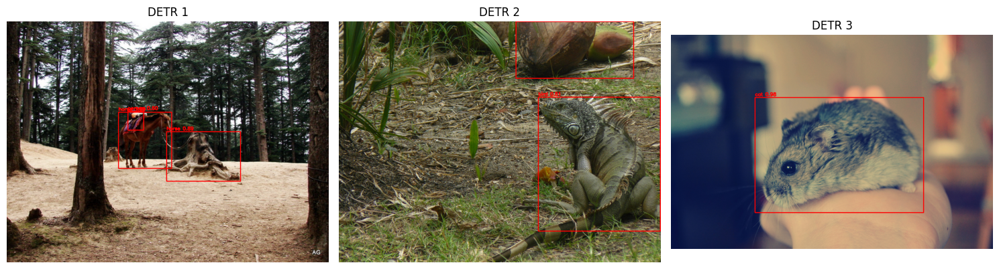

In [ ]:
# Mostro i risultati di DETR
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i in range(3):
    img_path = os.path.join(test_img_folder, img_per_detr[i])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    results = detr_preds[i]

    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = box.cpu().numpy()
        x1, y1, x2, y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])

        label_name = detr.config.id2label[label.item()]

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, f"{label_name} {score:.2f}", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    axes[i].imshow(img)
    axes[i].axis('off')
    axes[i].set_title(f"DETR {i+1}")

plt.tight_layout()
plt.show()

In [ ]:
# Confronto YOLO vs DETR
print("\nCONFRONTO YOLO vs DETR")
print("="*40)
print("\nYOLO (fine-tuned):")
print("  - Riconosce tutte e 5 le classi")
print("  - mAP@0.5 sul test:", metriche.box.map50)
print("  - Veloce")
print("\nDETR (pre-trained su COCO):")
print("  - Riconosce solo Horse e Mouse")
print("  - Non addestrato sulle nostre classi")
print("  - Piu lento")
print("\nCONCLUSIONE: YOLO e meglio per questo task perche l'ho addestrato sulle mie classi!")


CONFRONTO YOLO vs DETR

YOLO (fine-tuned):
  - Riconosce tutte e 5 le classi
  - mAP@0.5 sul test: 0.7051392931365602
  - Veloce

DETR (pre-trained su COCO):
  - Riconosce solo Horse e Mouse
  - Non addestrato sulle nostre classi
  - Piu lento

CONCLUSIONE: YOLO e meglio per questo task perche l'ho addestrato sulle mie classi!


## 10) Test col dataset del prof

Uso il modello migliore per fare inferenza sul dataset del prof.

In [47]:
def testa_modello_su_dataset(model, dataset_path, num_immagini=5, seed=42):
    """
    Testa un modello YOLO su un dataset e mostra i risultati.

    Args:
        model: Modello YOLO da testare
        dataset_path: Path al dataset (es. 'data/Animal Detection.v1i.yolov11')
        num_immagini: Numero di immagini da testare (default: 5)
        seed: Seed per la selezione casuale (default: 42)
    """
    # Provo diverse strutture di cartelle
    possible_paths = [
        os.path.join(dataset_path, "test/images"),
        os.path.join(dataset_path, "images/test"),
        os.path.join(dataset_path, "test"),
        os.path.join(dataset_path, "images")
    ]

    test_images_path = None
    for path in possible_paths:
        if os.path.exists(path):
            # Verifico che contenga file immagine
            files = os.listdir(path)
            if any(f.endswith(('.jpg', '.jpeg', '.png')) for f in files):
                test_images_path = path
                break

    if test_images_path is None:
        print("ERRORE: Cartella con immagini non trovata!")
        print("Provato in:", possible_paths)
        return

    print(f"Immagini trovate in: {test_images_path}")

    # Provo a trovare le label
    labels_path = None
    possible_label_paths = [
        os.path.join(dataset_path, "test/labels"),
        os.path.join(dataset_path, "labels/test"),
        os.path.join(dataset_path, "labels")
    ]

    for path in possible_label_paths:
        if os.path.exists(path):
            labels_path = path
            break

    if labels_path:
        print(f"Label trovate in: {labels_path}")
    else:
        print("Label non trovate - mostro solo inferenza")

    # Prendo tutte le immagini del test
    imgs = []
    for f in os.listdir(test_images_path):
        if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png'):
            imgs.append(f)

    print(f"Trovate {len(imgs)} immagini nel test")

    # Seleziono immagini casuali
    random.seed(seed)
    img_da_testare = random.sample(imgs, min(num_immagini, len(imgs)))

    print(f"\nSeleziono {len(img_da_testare)} immagini casuali per il test")

    # Faccio inferenza
    print("Faccio inferenza...")
    predizioni = []
    for img_name in img_da_testare:
        img_path = os.path.join(test_images_path, img_name)
        risultato = model(img_path)
        predizioni.append(risultato[0])

    print("Inferenza completata!\n")

    # Mostro i risultati
    print(f"Mostro {len(img_da_testare)} immagini:\n")

    for i in range(len(img_da_testare)):
        img_path = os.path.join(test_images_path, img_da_testare[i])

        print(f"Immagine {i+1}: {img_da_testare[i]}")

        img = cv2.imread(img_path)
        if img is None:
            print("  ERRORE caricamento\n")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        pred = predizioni[i]
        boxes = pred.boxes

        print(f"  Numero predizioni: {len(boxes)}")

        if len(boxes) == 0:
            print("  Nessun oggetto rilevato\n")
            plt.figure(figsize=(10, 8))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Immagine {i+1} (NO DETECTIONS)", fontsize=14)
            plt.show()
            continue

        # Disegno tutte le predizioni
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            label = classi[cls]

            print(f"    {label} (conf: {conf:.3f})")

            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)
            cv2.putText(img, f"{label} {conf:.2f}", (x1, y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        # Mostro immagine
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Immagine {i+1}", fontsize=14)
        plt.show()

        print()

    # Se ho le label, calcolo le metriche
    if labels_path:
        print("\n" + "="*50)
        print("CALCOLO METRICHE SUL DATASET")
        print("="*50)

        # Conto quante immagini hanno label
        num_labels = len([f for f in os.listdir(labels_path) if f.endswith('.txt')])
        print(f"Immagini con label: {num_labels}")

        if num_labels > 0:
            # Creo un file yaml temporaneo per la validazione
            # YOLO richiede train e val anche se usiamo solo test
            rel_images = os.path.relpath(test_images_path, dataset_path).replace('\\', '/')

            yaml_content = f"""path: {dataset_path}
train: {rel_images}
val: {rel_images}
test: {rel_images}

nc: {len(classi)}
names: {classi}
"""

            temp_yaml_path = '/content/temp_test.yaml'
            with open(temp_yaml_path, 'w') as f:
                f.write(yaml_content)

            print("\nEseguo validazione...")
            try:
                metriche_test = model.val(data=temp_yaml_path, split='test')

                print("\nRISULTATI METRICHE:")
                print(f"mAP@0.5: {metriche_test.box.map50:.4f}")
                print(f"mAP@0.5:0.95: {metriche_test.box.map:.4f}")
                print(f"Precision: {metriche_test.box.mp:.4f}")
                print(f"Recall: {metriche_test.box.mr:.4f}")
            except Exception as e:
                print(f"Errore nel calcolo delle metriche: {e}")

print("Funzione testa_modello_su_dataset definita!")

Funzione testa_modello_su_dataset definita!


In [42]:
# Opzione 1: Upload manuale (consigliata)
from google.colab import files
import zipfile

print("Carica il file test_set.zip dal tuo PC...")
uploaded = files.upload()

# Estrai il contenuto
for filename in uploaded.keys():
    print(f"Estrazione di {filename}...")
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall('/content/')

print("Dataset caricato in /content/test_set")

Carica il file test_set.zip dal tuo PC...


Saving test_set.zip to test_set (1).zip
Estrazione di test_set (1).zip...
Dataset caricato in /content/test_set


In [43]:
# Verifico che il dataset sia caricato correttamente
!ls -la /content/test_set/
!ls /content/test_set/images/test/ | head -5
print("\nNumero di immagini:", len(os.listdir('/content/test_set/images/test/')))

total 16
drwxr-xr-x 4 root root 4096 Dec  2 10:42 .
drwxr-xr-x 1 root root 4096 Dec  2 10:46 ..
drwxr-xr-x 3 root root 4096 Dec  2 10:42 images
drwxr-xr-x 3 root root 4096 Dec  2 10:42 labels
00876549dfcbcbad.jpg
010d42acb7498094.jpg
027cffb13d932cf2.jpg
02b7e70979560df7.jpg
0354aba2fc6c5903.jpg

Numero di immagini: 77


Immagini trovate in: /content/test_set/images/test
Label trovate in: /content/test_set/labels/test
Trovate 76 immagini nel test

Seleziono 5 immagini casuali per il test
Faccio inferenza...

image 1/1 /content/test_set/images/test/0ee38e79c504fe1c.jpg: 448x640 2 Horses, 2 Mules, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/test_set/images/test/6532daa2ed06d558.jpg: 448x640 1 Mouse, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/test_set/images/test/05982979d60a5646.jpg: 448x640 2 Horses, 9.2ms
Speed: 2.0ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/test_set/images/test/3a779071a540a3a2.jpg: 288x640 3 Mouses, 1 Hamster, 10.3ms
Speed: 1.6ms preprocess, 10.3ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /content/test_set/images/test/129d098f401181

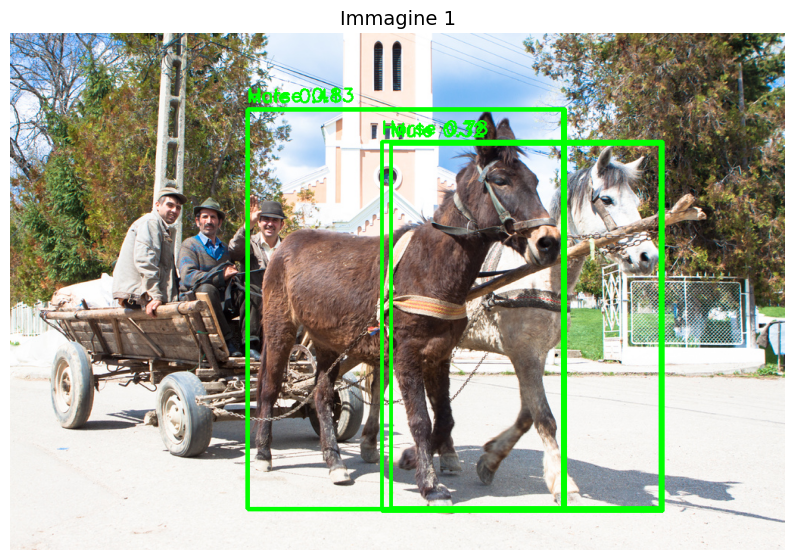


Immagine 2: 6532daa2ed06d558.jpg
  Numero predizioni: 1
    Mouse (conf: 0.696)


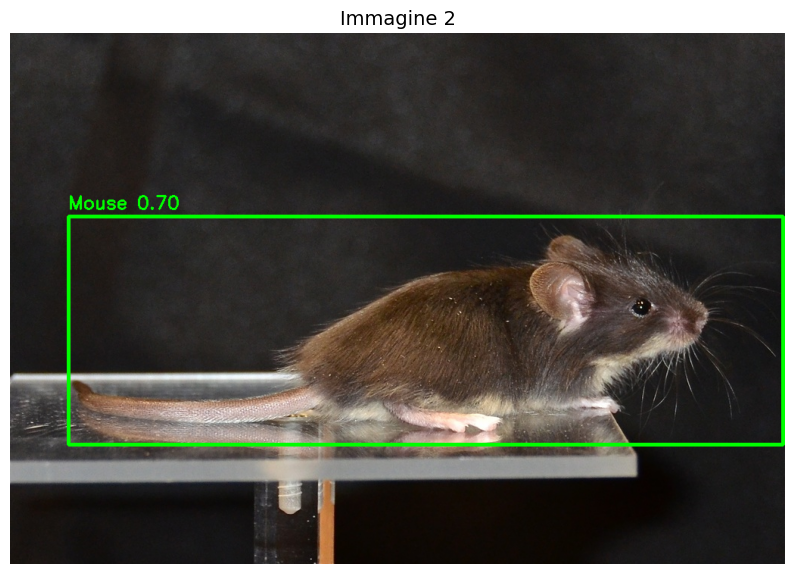


Immagine 3: 05982979d60a5646.jpg
  Numero predizioni: 2
    Horse (conf: 0.965)
    Horse (conf: 0.769)


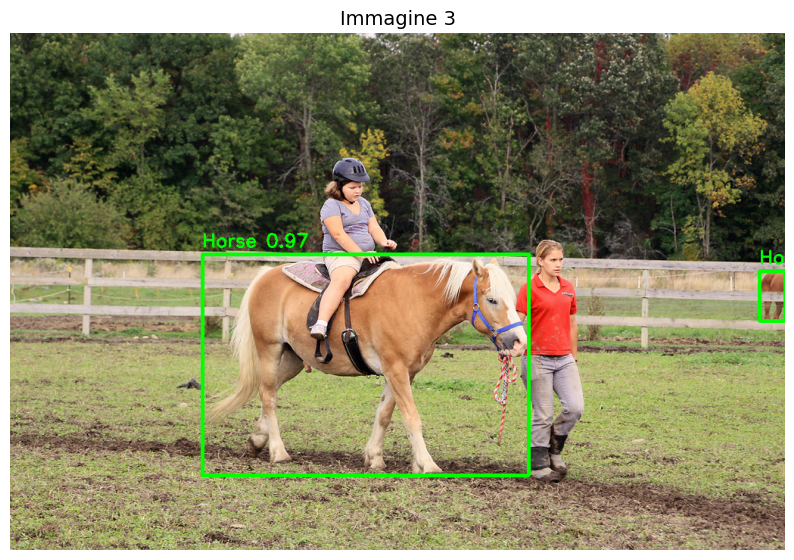


Immagine 4: 3a779071a540a3a2.jpg
  Numero predizioni: 4
    Mouse (conf: 0.718)
    Mouse (conf: 0.694)
    Hamster (conf: 0.670)
    Mouse (conf: 0.362)


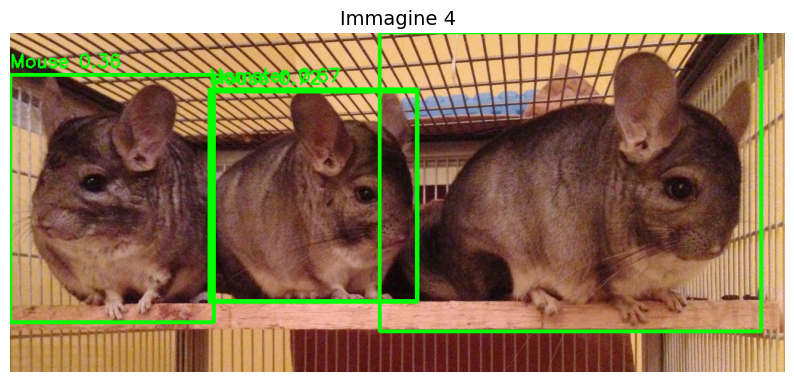


Immagine 5: 129d098f401181ed.jpg
  Numero predizioni: 2
    Horse (conf: 0.693)
    Mule (conf: 0.417)


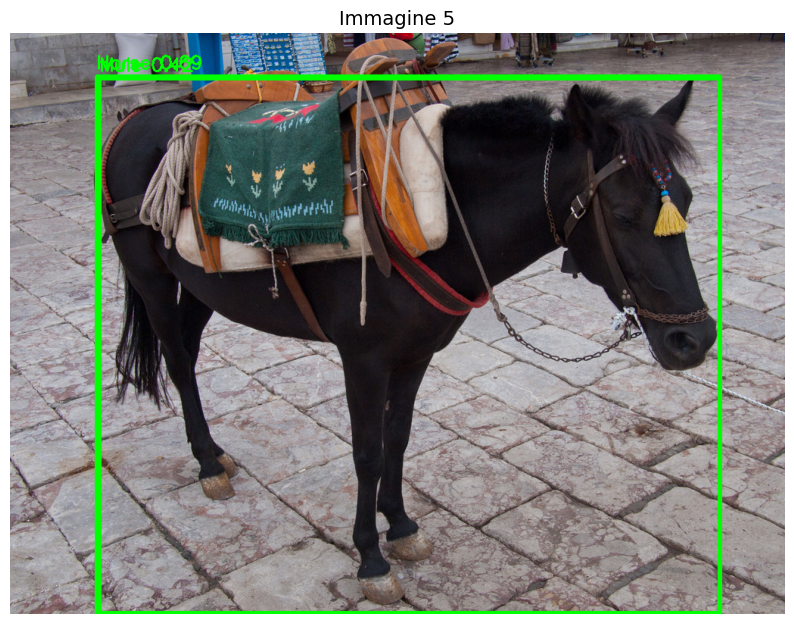



CALCOLO METRICHE SUL DATASET
Immagini con label: 76

Eseguo validazione...
Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3864.7±999.6 MB/s, size: 441.3 KB)
val: Scanning /content/test_set/labels/test... 76 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 76/76 1.3Kit/s 0.1s
val: New cache created: /content/test_set/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 3.5it/s 1.4s
                   all         76         98      0.691      0.891       0.83      0.741
                 Horse         20         28      0.783          1      0.949       0.85
                Lizard         20         20      0.909      0.995      0.988      0.926
                 Mouse         10         15      0.392          1      0.651      0.539
               Hamster         20         22      0.772       0.77      0.832  

In [48]:
# Testo il modello sul dataset del prof
testa_modello_su_dataset(
    model=best_model,
    dataset_path="/content/test_set",
    num_immagini=5,
    seed=42
)